## Lending Club Case Study

### Data understanding

#### Problem Statement:

A finance service company called the Lending Club offers customers to lend various types of loans. Some of the types of loans are business loans, personal loans, educational loans, home loans etc. 

When an applicant applies for a loan, the company has to take a decision for a loan approval based on the applicant’s information. 

When a person applies for a loan, there are two types of decisions that could be taken by the company:

Loan accepted: If the company approves the loan, there are 3 possible scenarios described below:

    Fully paid: Applicant has fully paid the loan (the principal and the interest rate)

    Current: Applicant is in the process of paying the instalments, i.e. the tenure of the loan is not yet completed. These candidates are not labelled as 'defaulted'.

    Charged-off: Applicant has not paid the instalments in due time for a long period of time, i.e. he/she has defaulted on the loan 

Loan rejected: The company had rejected the loan (because the candidate does not meet their requirements etc.). Since the loan was rejected, there is no transactional history of those applicants with the company and so this data is not available with the company (and thus in this dataset)

#### Business Objective:

Like most other lending companies, lending loans to ‘risky’ applicants is the largest source of financial loss (called credit loss). The credit loss is the amount of money lost by the lender when the borrower refuses to pay or runs away with the money owed. In other words, borrowers who default cause the largest amount of loss to the lenders. In this case, the customers labelled as 'charged-off' are the 'defaulters'. 

If one is able to identify these risky loan applicants, then such loans can be reduced thereby cutting down the amount of credit loss. Identification of such applicants using EDA is the aim of this case study.

In other words, the company wants to understand the driving factors (or driver variables) behind loan default, i.e. the variables which are strong indicators of default.  The company can utilise this knowledge for its portfolio and risk assessment.

#### Assumption

The dataset consists of data dictionary and loans details issued from 2007 to 2011 by the Lending Club. 

Since the company wants to understand the driving factor behind a defaults, only those variables will be considered for the analysis. These variables will be helpful in helping the investor to take a decision on whether or not to invest in the loan request. Customer behaviour information provided in the dataset will not be considered

Importing the required libraries for the analysis.

In [70]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go
from matplotlib.ticker import StrMethodFormatter
from plotly.subplots import make_subplots

import warnings
warnings.filterwarnings('ignore')

In [71]:
lc_df = pd.read_csv('loan.csv')

In [72]:
lc_df.shape

(39717, 111)

In [73]:
lc_df.describe()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,installment,annual_inc,dti,delinq_2yrs,inq_last_6mths,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
count,3.971700e+04,3.971700e+04,39717.000000,39717.000000,39717.000000,39717.000000,3.971700e+04,39717.000000,39717.000000,39717.000000,...,0.0,0.0,0.0,0.0,39020.000000,39678.0,0.0,0.0,0.0,0.0
mean,6.831319e+05,8.504636e+05,11219.443815,10947.713196,10397.448868,324.561922,6.896893e+04,13.315130,0.146512,0.869200,...,NaN,NaN,NaN,NaN,0.043260,0.0,NaN,NaN,NaN,NaN
std,2.106941e+05,2.656783e+05,7456.670694,7187.238670,7128.450439,208.874874,6.379377e+04,6.678594,0.491812,1.070219,...,NaN,NaN,NaN,NaN,0.204324,0.0,NaN,NaN,NaN,NaN
min,5.473400e+04,7.069900e+04,500.000000,500.000000,0.000000,15.690000,4.000000e+03,0.000000,0.000000,0.000000,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
25%,5.162210e+05,6.667800e+05,5500.000000,5400.000000,5000.000000,167.020000,4.040400e+04,8.170000,0.000000,0.000000,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
50%,6.656650e+05,8.508120e+05,10000.000000,9600.000000,8975.000000,280.220000,5.900000e+04,13.400000,0.000000,1.000000,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
75%,8.377550e+05,1.047339e+06,15000.000000,15000.000000,14400.000000,430.780000,8.230000e+04,18.600000,0.000000,1.000000,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
max,1.077501e+06,1.314167e+06,35000.000000,35000.000000,35000.000000,1305.190000,6.000000e+06,29.990000,11.000000,8.000000,...,NaN,NaN,NaN,NaN,2.000000,0.0,NaN,NaN,NaN,NaN


### Data Cleaning and Manipulation

Let's clean the dataset provided by first removing columns with the most missing values or NA. The threshold we would consider would be 80%

In [74]:
lc_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Columns: 111 entries, id to total_il_high_credit_limit
dtypes: float64(74), int64(13), object(24)
memory usage: 33.6+ MB


In [75]:
# calculating the percentage of the missing value and checking for those specific columns
null_columns = round(lc_df.isnull().sum()/lc_df.shape[0] * 100)
missing_val_col = null_columns[null_columns > 80]
missing_val_col

mths_since_last_record             93.0
next_pymnt_d                       97.0
mths_since_last_major_derog       100.0
annual_inc_joint                  100.0
dti_joint                         100.0
verification_status_joint         100.0
tot_coll_amt                      100.0
tot_cur_bal                       100.0
open_acc_6m                       100.0
open_il_6m                        100.0
open_il_12m                       100.0
open_il_24m                       100.0
mths_since_rcnt_il                100.0
total_bal_il                      100.0
il_util                           100.0
open_rv_12m                       100.0
open_rv_24m                       100.0
max_bal_bc                        100.0
all_util                          100.0
total_rev_hi_lim                  100.0
inq_fi                            100.0
total_cu_tl                       100.0
inq_last_12m                      100.0
acc_open_past_24mths              100.0
avg_cur_bal                       100.0


In [76]:
missing_val_col = list(missing_val_col.index)
missing_val_col

['mths_since_last_record',
 'next_pymnt_d',
 'mths_since_last_major_derog',
 'annual_inc_joint',
 'dti_joint',
 'verification_status_joint',
 'tot_coll_amt',
 'tot_cur_bal',
 'open_acc_6m',
 'open_il_6m',
 'open_il_12m',
 'open_il_24m',
 'mths_since_rcnt_il',
 'total_bal_il',
 'il_util',
 'open_rv_12m',
 'open_rv_24m',
 'max_bal_bc',
 'all_util',
 'total_rev_hi_lim',
 'inq_fi',
 'total_cu_tl',
 'inq_last_12m',
 'acc_open_past_24mths',
 'avg_cur_bal',
 'bc_open_to_buy',
 'bc_util',
 'mo_sin_old_il_acct',
 'mo_sin_old_rev_tl_op',
 'mo_sin_rcnt_rev_tl_op',
 'mo_sin_rcnt_tl',
 'mort_acc',
 'mths_since_recent_bc',
 'mths_since_recent_bc_dlq',
 'mths_since_recent_inq',
 'mths_since_recent_revol_delinq',
 'num_accts_ever_120_pd',
 'num_actv_bc_tl',
 'num_actv_rev_tl',
 'num_bc_sats',
 'num_bc_tl',
 'num_il_tl',
 'num_op_rev_tl',
 'num_rev_accts',
 'num_rev_tl_bal_gt_0',
 'num_sats',
 'num_tl_120dpd_2m',
 'num_tl_30dpd',
 'num_tl_90g_dpd_24m',
 'num_tl_op_past_12m',
 'pct_tl_nvr_dlq',
 'percen

In [77]:
# Dropping the columns mentioned in missing_val_col
lc_df.drop(missing_val_col, axis = 1,inplace = True)
lc_df

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,last_pymnt_amnt,last_credit_pull_d,collections_12_mths_ex_med,policy_code,application_type,acc_now_delinq,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,...,171.62,May-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,...,119.66,Sep-13,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,...,649.91,May-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,...,357.48,Apr-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
4,1075358,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,...,67.79,May-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39712,92187,92174,2500,2500,1075.0,36 months,8.07%,78.42,A,A4,...,80.90,Jun-10,NaN,1,INDIVIDUAL,0,NaN,0,NaN,NaN
39713,90665,90607,8500,8500,875.0,36 months,10.28%,275.38,C,C1,...,281.94,Jul-10,NaN,1,INDIVIDUAL,0,NaN,0,NaN,NaN
39714,90395,90390,5000,5000,1325.0,36 months,8.07%,156.84,A,A4,...,0.00,Jun-07,NaN,1,INDIVIDUAL,0,NaN,0,NaN,NaN
39715,90376,89243,5000,5000,650.0,36 months,7.43%,155.38,A,A2,...,0.00,Jun-07,NaN,1,INDIVIDUAL,0,NaN,0,NaN,NaN


In [78]:
lc_df.shape

(39717, 55)

#### Conclusion: Custom behaviour variables should be dropped as well, since they don't add any value to our investigation.

["delinq_2yrs",
"earliest_cr_line",
"inq_last_6mths",
"open_acc", 
"pub_rec",
"revol_bal",
"revol_util",
"total_acc",
"out_prncp",
"out_prncp_inv",
"total_pymnt",
"total_pymnt_inv",
"total_rec_prncp",
"total_rec_int",
"total_rec_late_fee",
"recoveries",
"collection_recovery_fee",
"last_pymnt_d",
"last_pymnt_amnt",
"last_credit_pull_d",
"application_type"]

# TODO

"delinq_2yrs", "earliest_cr_line", "inq_last_6mths", "open_acc", "pub_rec", "revol_bal", "revol_util", "total_acc", "out_prncp", "out_prncp_inv", "total_pymnt", "total_pymnt_inv", "total_rec_prncp", "total_rec_int", "total_rec_late_fee", "recoveries", "collection_recovery_fee", "last_pymnt_d", "last_pymnt_amnt", "last_credit_pull_d", "application_type"

In [79]:
# Dropping the columns considered as customer behaviour variables
lc_df_columns = ["delinq_2yrs",
"earliest_cr_line",
"inq_last_6mths",
"open_acc", 
"pub_rec",
"revol_bal",
"revol_util",
"total_acc",
"out_prncp",
"out_prncp_inv",
"total_pymnt",
"total_pymnt_inv",
"total_rec_prncp",
"total_rec_int",
"total_rec_late_fee",
"recoveries",
"collection_recovery_fee",
"last_pymnt_d",
"last_pymnt_amnt",
"last_credit_pull_d",
"application_type",
"url",
"zip_code",
"addr_state",
"desc",
"title"]
lc_df.drop(lc_df_columns, axis = 1, inplace = True)
lc_df.shape

(39717, 29)

1. url : URL for LC page with each memberid, hence it does not contribute for analysis.
2. addr_state : addr_state,zip_code does not contribute to analysis since its member portfolio information.
3. desc : Loan description provided by the borrower, therefore it won't be helpful in the analysis.
4. title : is a loan title provided by the borrower, therefore it won't be helpful in the analysis.
5. member_id : id provided to the loan, hence it does not contribute for analysis.
6. id: unique id provided to the member, hence it does not contribute for analysis
7. initial_list_status: is a initial listing status of the loan.The only value found in the dataset is F.Therefore it won't be helpful in the analysis.
8. collections_12_mths_ex_med: is number of collections made in 12 months excluding medical collections. The only value found in the dataset is 0.Therefore it won't be helpful in the analysis.
9. policy_code: is a column of the policy code for the loan. The value in the dataset is 1, which means all are publicly available, hence nothing to contribute for analysis
10. acc_now_delinq: is a no of account in which borrowers are delinquent. The values present in the entire dataset is 0, hence it won't contribute for analysis.
11. chargeoff_within_12_mths: no. of charge off within 12 months. The values present in the entire dataset is 0, hence it won't contribute for analysis.
12. delinq_amnt: is a past due amount owed to the lender. The values present in the entire dataset is 0, hence it won't contribute for analysis.
13. tax_liens: is a no. of tax liens. The values present in the entire dataset is 0, hence it won't contribute for analysis.
14. mths_since_last_delinq: DOUBT in this!!!!!!!!!
15. pub_rec_bankruptcies: is a no. of bankcruptcies declared by the borrowers. Since the customer can file bankruptcy insurance against it it won't affect the financial stature of the borrower. Hence it won't contribute for analysis.

In [80]:
lc_df_columns = ["id",
"member_id",
"initial_list_status",
"collections_12_mths_ex_med", 
"policy_code",
"acc_now_delinq",
"chargeoff_within_12_mths",
"delinq_amnt",
"tax_liens",
"mths_since_last_delinq",
"pub_rec_bankruptcies"
]
lc_df.drop(lc_df_columns, axis = 1, inplace = True)
lc_df.shape

(39717, 18)

##### Since the applicant is in the process of paying the installments and the tenure of the loan has not yet been completed. These candidates are not labelled as 'defaulted'. Hence wont be consired for the analysis.

In [81]:
lc_df = lc_df[lc_df["loan_status"] != "Current"]

In [82]:
lc_df.shape

(38577, 18)

In [88]:
lc_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 37544 entries, 0 to 39716
Data columns (total 18 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   loan_amnt            37544 non-null  int64  
 1   funded_amnt          37544 non-null  int64  
 2   funded_amnt_inv      37544 non-null  float64
 3   term                 37544 non-null  object 
 4   int_rate             37544 non-null  object 
 5   installment          37544 non-null  float64
 6   grade                37544 non-null  object 
 7   sub_grade            37544 non-null  object 
 8   emp_title            36136 non-null  object 
 9   emp_length           37544 non-null  object 
 10  home_ownership       37544 non-null  object 
 11  annual_inc           37544 non-null  float64
 12  verification_status  37544 non-null  object 
 13  issue_d              37544 non-null  object 
 14  loan_status          37544 non-null  object 
 15  pymnt_plan           37544 non-null 

 #### Variables considered in the data analysis
 
 1.   loan_amnt            The listed amount of the loan applied for by the borrower.  
 2.   funded_amnt          The total amount committed to that loan at that point in time.
 3.   funded_amnt_inv      The total amount committed by investors for that loan at that point in time.
 4.   term                 The number of payments on the loan. Values are in months and can be either 36 or 60.
 5.   int_rate             Interest Rate on the loan
 6.   installment          The monthly payment owed by the borrower if the loan originates.
 7.   grade                LC assigned loan grade
 8.   sub_grade             38577 non-null  object 
 9.   emp_title             36191 non-null  object 
 10.  emp_length            37544 non-null  object 
 11.  home_ownership        38577 non-null  object 
 12.  annual_inc            38577 non-null  float64
 13.  verification_status   38577 non-null  object 
 14.  issue_d               38577 non-null  object 
 15.  loan_status           38577 non-null  object 
 16.  pymnt_plan            38577 non-null  object 
 17.  purpose               38577 non-null  object 
 18.  dti                   38577 non-null  float64
 19.  pub_rec_bankruptcies  37880 non-null  float64

In [84]:
lc_df["emp_length"].unique()

array(['10+ years', '< 1 year', '3 years', '8 years', '9 years',
       '4 years', '5 years', '1 year', '6 years', '2 years', '7 years',
       nan], dtype=object)

In [93]:
# Since emp_length have nan values removing those rows
lc_df = lc_df[~lc_df.emp_length.isnull()]

In [94]:
lc_df.shape

(37544, 18)

In [95]:
lc_df['issue_d'].unique()

array(['Dec-11', 'Nov-11', 'Oct-11', 'Sep-11', 'Aug-11', 'Jul-11',
       'Jun-11', 'May-11', 'Apr-11', 'Mar-11', 'Feb-11', 'Jan-11',
       'Dec-10', 'Nov-10', 'Oct-10', 'Sep-10', 'Aug-10', 'Jul-10',
       'Jun-10', 'May-10', 'Apr-10', 'Mar-10', 'Feb-10', 'Jan-10',
       'Dec-09', 'Nov-09', 'Oct-09', 'Sep-09', 'Aug-09', 'Jul-09',
       'Jun-09', 'May-09', 'Apr-09', 'Mar-09', 'Feb-09', 'Jan-09',
       'Dec-08', 'Nov-08', 'Oct-08', 'Sep-08', 'Aug-08', 'Jul-08',
       'Jun-08', 'May-08', 'Apr-08', 'Mar-08', 'Feb-08', 'Jan-08',
       'Dec-07', 'Nov-07', 'Oct-07', 'Sep-07', 'Aug-07', 'Jul-07',
       'Jun-07'], dtype=object)

#### Added two columns derived from issue date of the loan into issue_d_month and issue_d_year

In [67]:
lc_df["issue_d"] = pd.to_datetime(lc_df["issue_d"])
lc_df['issue_d_month'] = pd.to_datetime(lc_df['issue_d']).dt.month
lc_df['issue_d_year'] = pd.to_datetime(lc_df['issue_d']).dt.year

In [96]:
# Checking for null values in the final dataset considered for the analysis
lc_df.isnull().sum()

loan_amnt                 0
funded_amnt               0
funded_amnt_inv           0
term                      0
int_rate                  0
installment               0
grade                     0
sub_grade                 0
emp_title              1408
emp_length                0
home_ownership            0
annual_inc                0
verification_status       0
issue_d                   0
loan_status               0
pymnt_plan                0
purpose                   0
dti                       0
dtype: int64

In [97]:
lc_df["term"].unique()

array([' 36 months', ' 60 months'], dtype=object)

In [99]:
# Picking only the numeric value which is 36 and 60 in order to plot a better graph
lc_df['term'] = lc_df.term.apply(lambda x: x.split()[0])
lc_df['term']

0        36
1        60
2        36
3        36
5        36
         ..
39712    36
39713    36
39714    36
39715    36
39716    36
Name: term, Length: 37544, dtype: object

In [160]:
lc_df["grade"].unique()

array(['B', 'C', 'A', 'E', 'F', 'D', 'G'], dtype=object)

In [161]:
lc_df["sub_grade"].unique()

array(['B2', 'C4', 'C5', 'C1', 'A4', 'E1', 'F2', 'B5', 'C3', 'B1', 'D1',
       'A1', 'B3', 'B4', 'C2', 'D2', 'A3', 'A5', 'D5', 'A2', 'E4', 'D3',
       'D4', 'F3', 'E3', 'F1', 'E5', 'G4', 'E2', 'G2', 'G1', 'F5', 'F4',
       'G5', 'G3'], dtype=object)

In [162]:
lc_df["emp_length"].unique()

array(['10+ years', '< 1 year', '3 years', '8 years', '9 years',
       '4 years', '5 years', '1 year', '6 years', '2 years', '7 years'],
      dtype=object)

In [163]:
lc_df["home_ownership"].unique()

array(['RENT', 'OWN', 'MORTGAGE', 'OTHER', 'NONE'], dtype=object)

In [164]:
lc_df["verification_status"].unique()

array(['Verified', 'Source Verified', 'Not Verified'], dtype=object)

In [165]:
lc_df["purpose"].unique()

array(['credit_card', 'car', 'small_business', 'other', 'wedding',
       'debt_consolidation', 'home_improvement', 'major_purchase',
       'medical', 'moving', 'vacation', 'house', 'renewable_energy',
       'educational'], dtype=object)

## Data Analysis

List of categorical variables which can be investigated based on their unique unordered values

1. loan_status
2. term
3. grade
4. sub_grade
5. emp_title
6. emp_length
7. home_ownership
8. verification_status
9. purpose

In [92]:
# Create two different dataset categorised by loan_status e.i Fully Paid and Charged Off
lc_fully_paid = lc_df[lc_df['loan_status'] == "Fully Paid"]
lc_charged_off = lc_df[lc_df['loan_status'] == "Charged Off"]

## Univariant analysis

### Loan Status

<Axes: >

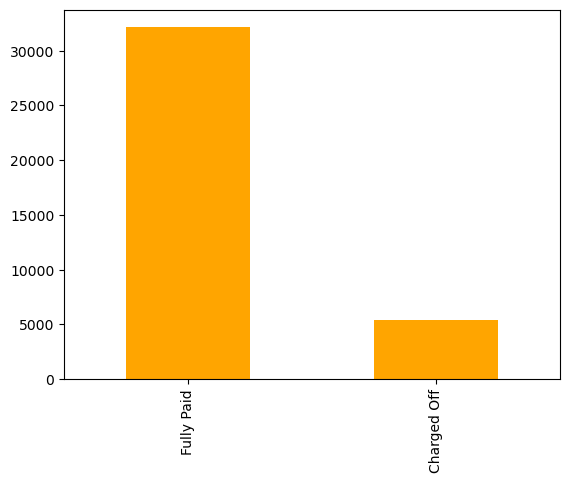

In [198]:
lc_df.loan_status.value_counts().plot(kind='bar', color = 'Orange')


Insight :

### Term

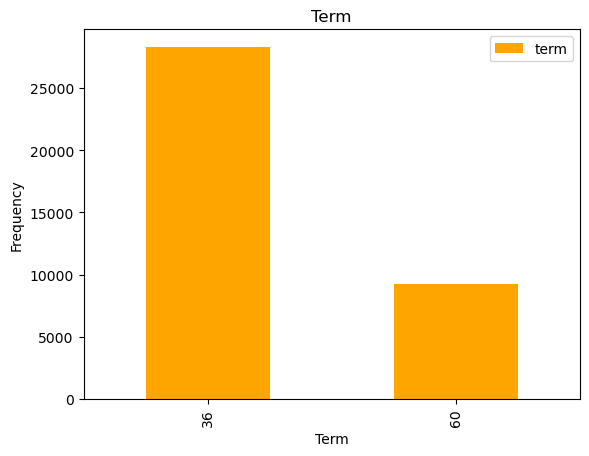

In [167]:
lc_df.term.value_counts().plot(kind='bar' , color = 'Orange')
plt.xlabel('Term')
plt.ylabel('Frequency')
plt.title('Term')
plt.xticks(rotation=90)
plt.legend(loc='upper right')
plt.show()

#sns.set_style("Set2")
#sns.barplot(x = 'index' , y = lc_df.term.value_counts() , data = lc_df)

<Axes: >

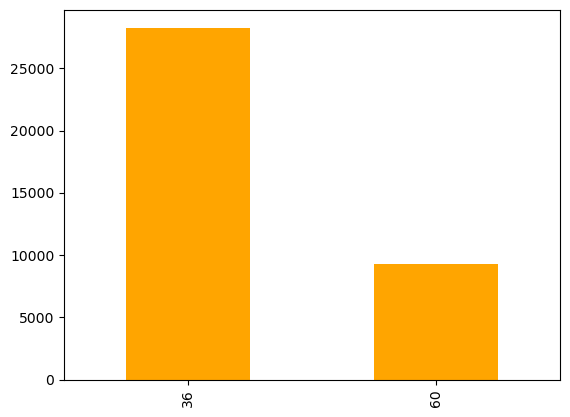

In [168]:
lc_df.term.value_counts().plot(kind='bar' , color = 'Orange')

Insight: Borrowers have taken 36 months tenure more than 60 months.

# Grade

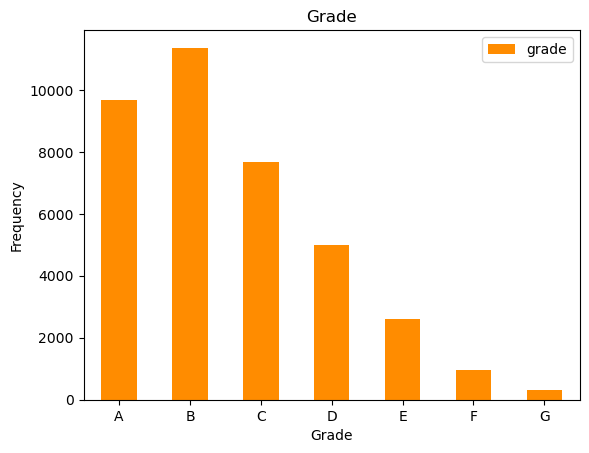

In [181]:
lc_df.grade.value_counts().sort_index().plot(kind='bar' , color = 'DarkOrange')
plt.xlabel('Grade')
plt.ylabel('Frequency')
plt.title('Grade')
plt.xticks(rotation=0)
plt.legend(loc='upper right')
plt.show()

Insight: Most Borrowers comes under A and B grade.

# Sub Grade



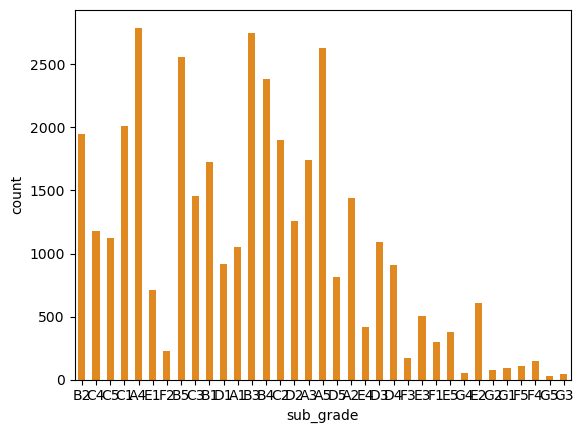

In [180]:
sns.countplot(x = 'sub_grade' , data = lc_df, width= 0.5, color= 'Darkorange')
#order= lc_df['sub_grade'].sort_index())
#plt.subplots_adjust(hspace= 15, wspace=15)
plt.show()

## Home Ownership

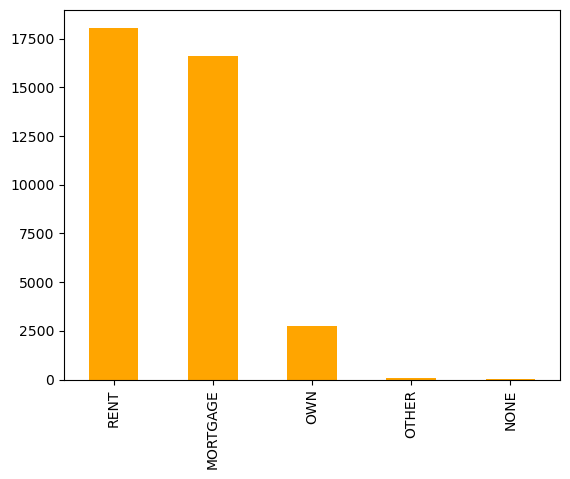

In [200]:
lc_df.home_ownership.value_counts().plot(kind='bar', color = 'Orange')
plt.show()

In [ ]:
Insight : Maximum loan taken by renter

# Loan Amount

Text(0.5, 1.0, 'Loan Amount')

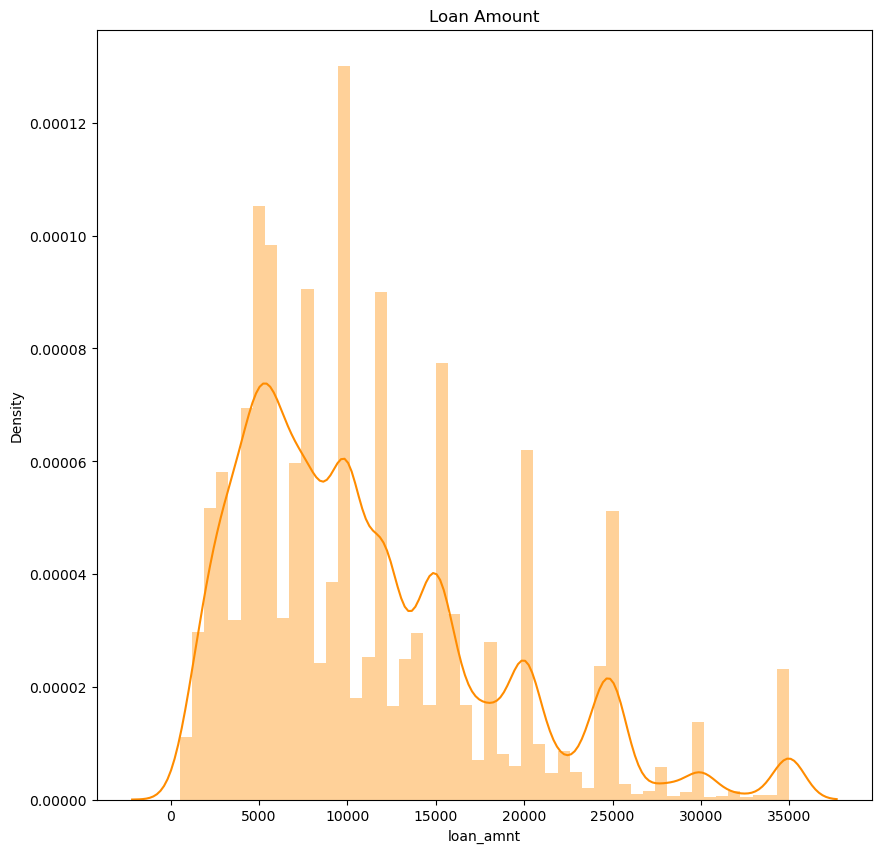

In [179]:
plt.figure(figsize=(10,10))
sns.distplot(lc_df.loan_amnt ,color = 'darkorange' )
plt.title('Loan Amount')

In [ ]:
Insight : Maximum people take 10000 loan

In [201]:
lc_df.sub_grade.value_counts().sort_index().plt.subplot 
#(kind='bar' , color = 'Orange', wspace = 0.5)
plt.xlabel('Grade')
plt.ylabel('Frequency')
plt.title('Grade')
plt.xticks(rotation=0)
plt.legend(loc='upper right')
plt.show()


AttributeError: 'Series' object has no attribute 'plt'

## Bivariate Analayis

 ## Term Vs Loan Status

In [ ]:
# def countPlot(x, data, group1, group2, legend, title, xlabel, ylabel):
#     fig, ax = plt.subplots(ncols=2, figsize=(12,8))
#     plt.subplots_adjust(hspace = 0.4, top = 0.8)

#     g1 = sns.countplot(x=x,data=data, 
#               palette="Set2", 
#               hue = legend)
#     label_values = data[group1].value_counts().values
#     g1.bar_label(container = g1.containers[0], labels=label_values, fontsize=8)

#     label_values1 = data[group2].value_counts().values
#     g1.bar_label(container = g1.containers[1], labels=label_values1, fontsize=8)

#     g1.set_title(title, fontsize=13)
#     g1.set_xlabel(xlabel)
#     g1.set_ylabel(ylabel)
#     plt.show()

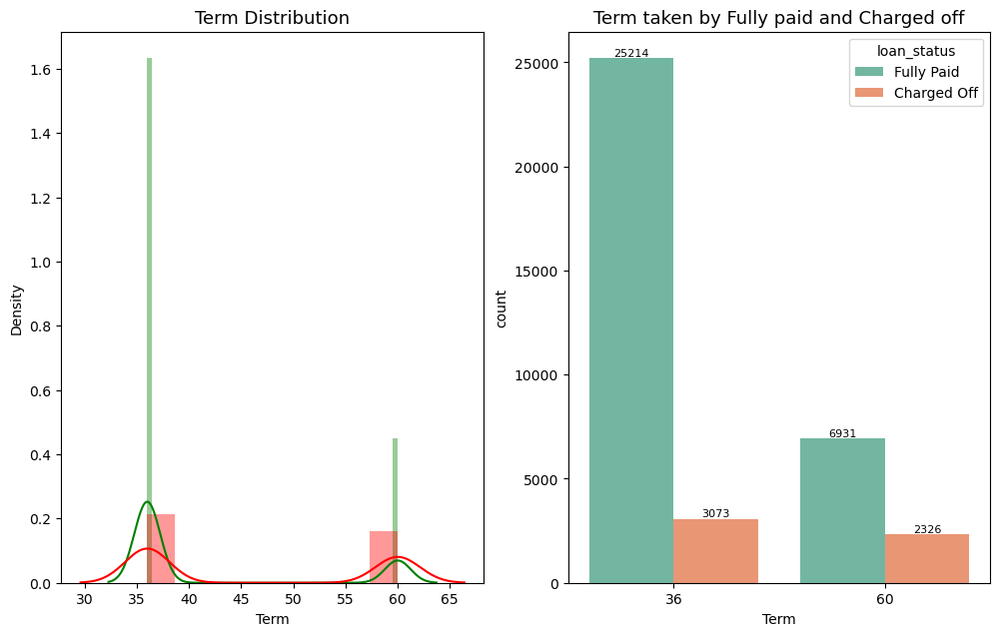

In [231]:
fig, ax = plt.subplots(ncols=2, figsize=(12,8))
plt.subplots_adjust(hspace = 0.4, top = 0.8)

g1 = sns.distplot(lc_fully_paid["term"], ax=ax[0], 
             color="g")
g1 = sns.distplot(lc_charged_off["term"], ax=ax[0], 
             color='red')
g1.set_title("Term Distribution", fontsize=13)
g1.set_xlabel("Term")

g2 = sns.countplot(x="term",data=lc_df, 
              palette="Set2", ax=ax[1], 
              hue = "loan_status")
label_values = lc_fully_paid['term'].value_counts()
g2.bar_label(container = g2.containers[0], labels=label_values, fontsize=8)

label_values1 = lc_charged_off['term'].value_counts()
g2.bar_label(container = g2.containers[1], labels=label_values1, fontsize=8)

g2.set_title("Term taken by Fully paid and Charged off", fontsize=13)
g2.set_xlabel("Term")
plt.show()

In [221]:
lc_df.groupby('loan_status')['term'].describe()

,count,unique,top,freq
loan_status,,,,
Charged Off,5399,2,36,3073
Fully Paid,32145,2,36,25214


## Grade Vs Loan status

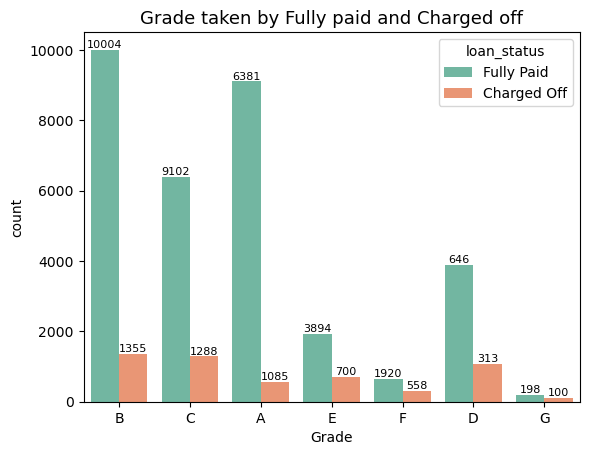

In [232]:
g1 = sns.countplot(x="grade",data=lc_df, 
              palette="Set2", 
              hue = "loan_status")
label_values = lc_fully_paid['grade'].value_counts()
g1.bar_label(container = g1.containers[0], labels=label_values, fontsize=8)

label_values1 = lc_charged_off['grade'].value_counts()
g1.bar_label(container = g1.containers[1], labels=label_values1, fontsize=8)

g1.set_title("Grade taken by Fully paid and Charged off", fontsize=13)
g1.set_xlabel("Grade")
plt.show()

In [223]:
lc_df.groupby('loan_status')['grade'].describe()

,count,unique,top,freq
loan_status,,,,
Charged Off,5399,7,B,1355
Fully Paid,32145,7,B,10004


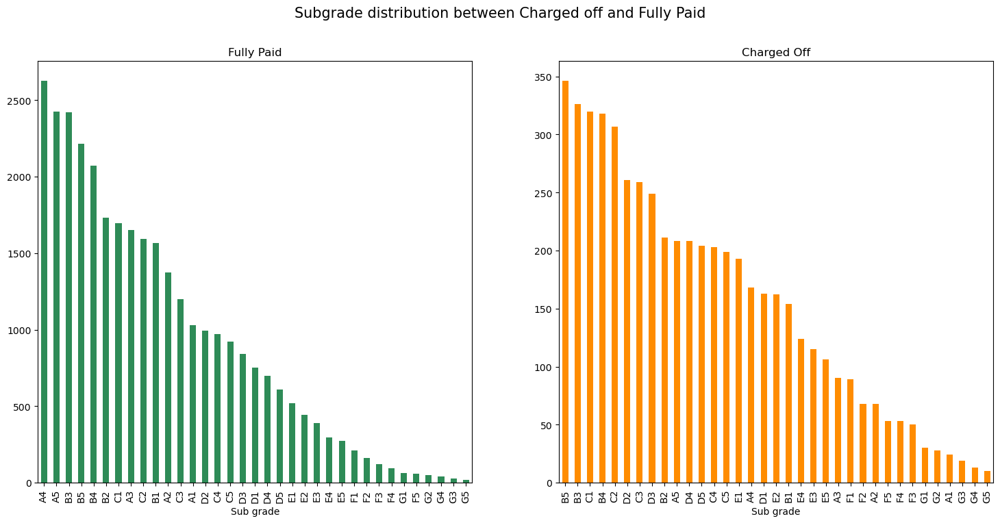

In [271]:
# fig, ax = plt.subplots(figsize=(12,5))
# g1 = sns.countplot(x="sub_grade",data=lc_df, 
#               palette="Set2", 
#               hue = "loan_status")
# label_values = lc_fully_paid['sub_grade'].value_counts()
# g1.bar_label(container = g1.containers[0], labels=label_values, fontsize=8)

# label_values1 = lc_charged_off['sub_grade'].value_counts()
# g1.bar_label(container = g1.containers[1], labels=label_values1, fontsize=8)

# g1.set_title("sub_grade taken by Fully paid and Charged off", fontsize=13)
# g1.set_xlabel("sub_grade")
# plt.show()
plt.figure(figsize=(18,8))

plt.subplot(1, 2, 1)
plt.xlabel('Sub grade')
plt.title('Fully Paid')
lc_fully_paid.sub_grade.value_counts().plot(kind='bar',color = "seagreen")


plt.subplot(1, 2, 2)
lc_charged_off.sub_grade.value_counts().plot(kind='bar',color = "darkorange")
plt.xlabel('Sub grade')
plt.title('Charged Off')

plt.suptitle("Subgrade distribution between Charged off and Fully Paid",fontsize=15)
plt.show()

In [225]:
lc_df.groupby('loan_status')['sub_grade'].describe()

,count,unique,top,freq
loan_status,,,,
Charged Off,5399,35,B5,346
Fully Paid,32145,35,A4,2624


## Employee Lenght Vs Loan Status

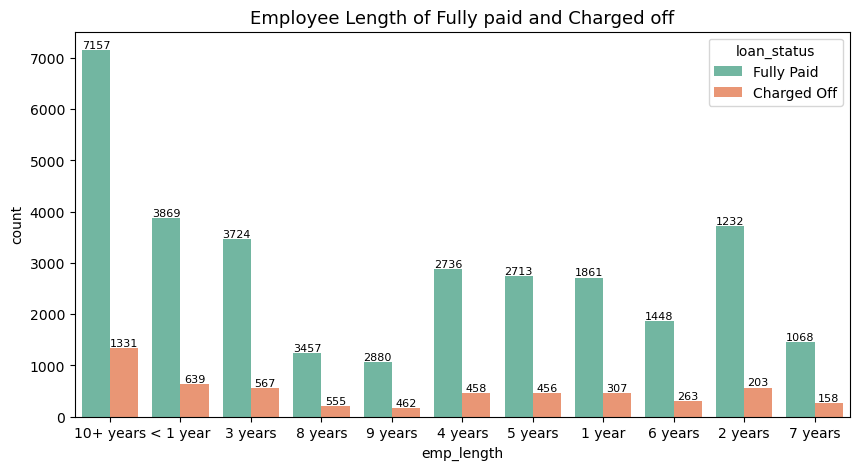

In [152]:
fig, ax = plt.subplots(figsize=(10,5))
g1 = sns.countplot(x="emp_length",data=lc_df, 
              palette="Set2", 
              hue = "loan_status")
label_values = lc_fully_paid['emp_length'].value_counts().values
g1.bar_label(container = g1.containers[0], labels=label_values, fontsize=8)

label_values1 = lc_charged_off['emp_length'].value_counts().values
g1.bar_label(container = g1.containers[1], labels=label_values1, fontsize=8)

g1.set_title("Employee Length of Fully paid and Charged off", fontsize=13)
g1.set_xlabel("emp_length")
plt.show()

In [150]:
lc_df.groupby("loan_status")['emp_length'].describe()

,count,unique,top,freq
loan_status,,,,
Charged Off,5399,11,10+ years,1331
Fully Paid,32145,11,10+ years,7157


## Home Ownership Vs Loan Status

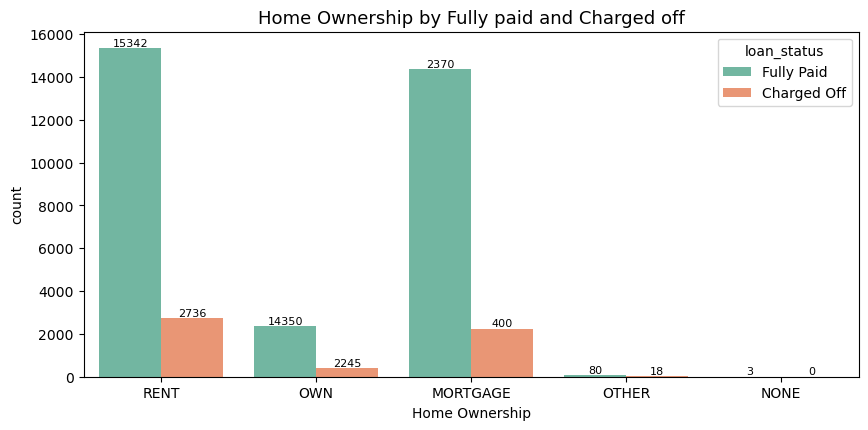

In [171]:
fig, ax = plt.subplots(figsize=(10,5))
plt.subplots_adjust(hspace = 0.4, top = 0.8)

g2 = sns.countplot(x="home_ownership",data=lc_df, 
              palette="Set2",
              hue = "loan_status")
label_values = lc_fully_paid['home_ownership'].value_counts().values
g2.bar_label(container = g2.containers[0], labels=label_values, fontsize=8)

label_values1 = lc_charged_off['home_ownership'].value_counts().values
g2.bar_label(container = g2.containers[1], labels=label_values1, fontsize=8)

g2.set_title("Home Ownership by Fully paid and Charged off", fontsize=13)
g2.set_xlabel("Home Ownership")
plt.show()

In [170]:
lc_df.groupby("loan_status")['home_ownership'].describe()

,count,unique,top,freq
loan_status,,,,
Charged Off,5399,4,RENT,2736
Fully Paid,32145,5,RENT,15342


### Categorical variable : verification_status

## Verification_status VS Loan Status

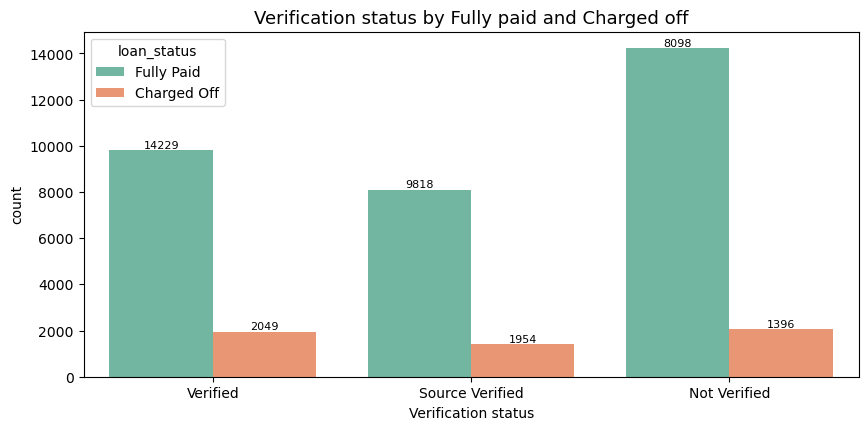

In [185]:
fig, ax = plt.subplots(figsize=(10,5))
plt.subplots_adjust(hspace = 0.4, top = 0.8)

g2 = sns.countplot(x="verification_status",data=lc_df, 
              palette="Set2",
              hue = "loan_status")
label_values = lc_fully_paid['verification_status'].value_counts().values
g2.bar_label(container = g2.containers[0], labels=label_values, fontsize=8)

label_values1 = lc_charged_off['verification_status'].value_counts().values
g2.bar_label(container = g2.containers[1], labels=label_values1, fontsize=8)

g2.set_title("Verification status by Fully paid and Charged off", fontsize=13)
g2.set_xlabel("Verification status")
plt.show()

In [186]:
lc_df.groupby("loan_status")['verification_status'].describe()

,count,unique,top,freq
loan_status,,,,
Charged Off,5399,3,Not Verified,2049
Fully Paid,32145,3,Not Verified,14229


### Conclusion:

### Categorical variable : purpose

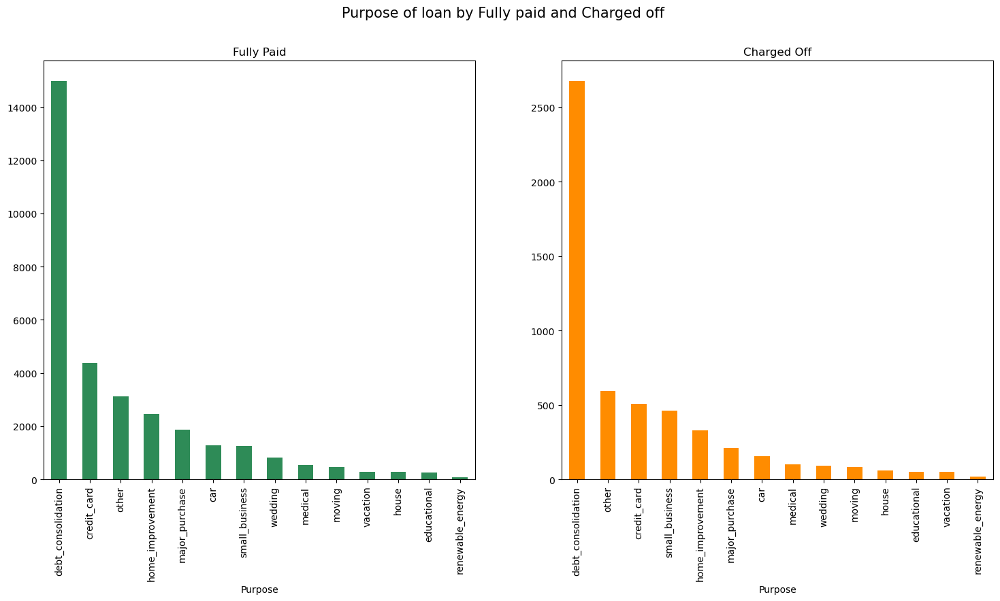

In [273]:
# fig, ax = plt.subplots(figsize=(12,5))
# plt.subplots_adjust(hspace = 0.4, top = 0.8)

# g2 = sns.countplot(x="purpose",data=lc_df, 
#               palette="Set2",
#               hue = "loan_status")
# plt.xticks(rotation=60)
# label_values = lc_fully_paid['purpose'].value_counts().values
# g2.bar_label(container = g2.containers[0], labels=label_values, fontsize=8)

# label_values1 = lc_charged_off['purpose'].value_counts().values
# g2.bar_label(container = g2.containers[1], labels=label_values1, fontsize=8)

# g2.set_title("Purpose of loan by Fully paid and Charged off", fontsize=13)
# g2.set_xlabel("Purpose of loan")

# plt.show()

plt.figure(figsize=(18,8))

plt.subplot(1, 2, 1)
plt.xlabel('Purpose')
plt.title('Fully Paid')
lc_fully_paid.purpose.value_counts().plot(kind='bar',color = "seagreen")


plt.subplot(1, 2, 2)
lc_charged_off.purpose.value_counts().plot(kind='bar',color = "darkorange")
plt.xlabel('Purpose')
plt.title('Charged Off')

plt.suptitle("Purpose of loan by Fully paid and Charged off",fontsize=15)
plt.show()

In [189]:
lc_df.groupby("loan_status")['purpose'].describe()

,count,unique,top,freq
loan_status,,,,
Charged Off,5399,14,debt_consolidation,2679
Fully Paid,32145,14,debt_consolidation,14996


#### Conclusion:

### Conclusion: Above are the categorical variables with it unique values

### Univariate and segmented univariate analysis

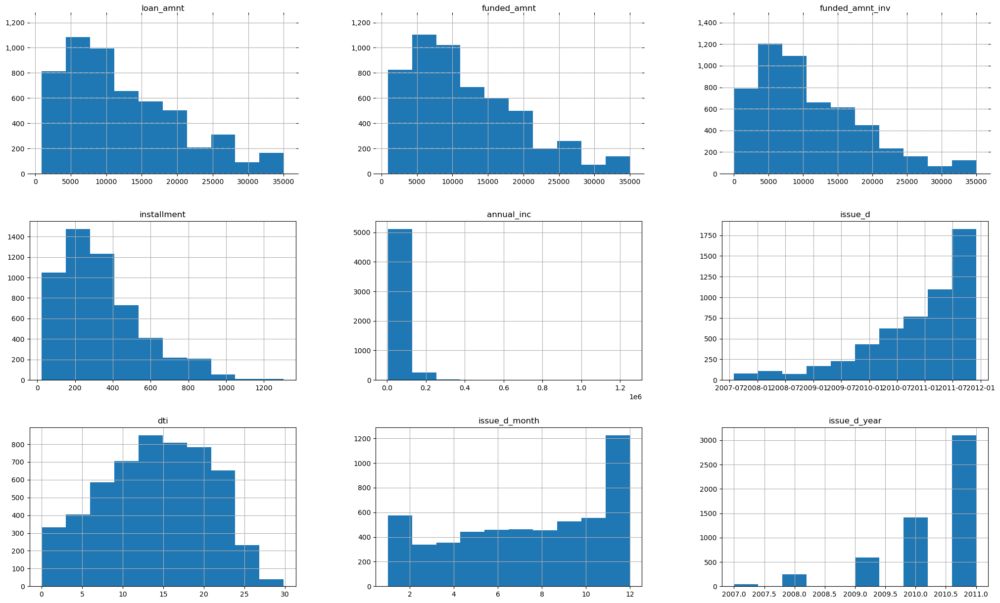

In [275]:
ax = lc_charged_off.hist(figsize=(25,15))
ax = ax[0]
for x in ax:

    # Despine
    x.spines['right'].set_visible(False)
    x.spines['top'].set_visible(False)
    x.spines['left'].set_visible(False)

    # Switch off ticks
    x.tick_params(axis="both", which="both", bottom="off", top="off", labelbottom="on", left="off", right="off", labelleft="off")

    # Draw horizontal axis lines
    vals = x.get_yticks()
    for tick in vals:
        x.axhline(y=tick, linestyle='dashed', alpha=0.4, color='#eeeeee', zorder=1)

    # Format y-axis label
    x.yaxis.set_major_formatter(StrMethodFormatter('{x:,g}'))

In [1]:
fig = px.box(lc_df, x="loan_status", y="loan_amnt",title="Loan amount between loan status")
fig.show()

NameError: name 'px' is not defined

In [57]:
lc_df.groupby('loan_status')['loan_amnt'].describe()

,count,mean,std,min,25%,50%,75%,max
loan_status,,,,,,,,
Charged Off,5399.0,12244.077607,8086.515636,900.0,6000.0,10000.0,17000.0,35000.0
Fully Paid,32145.0,10930.419972,7206.743260,500.0,5400.0,9600.0,15000.0,35000.0


## Issue Year/Month Vs Funded Amount by Investor

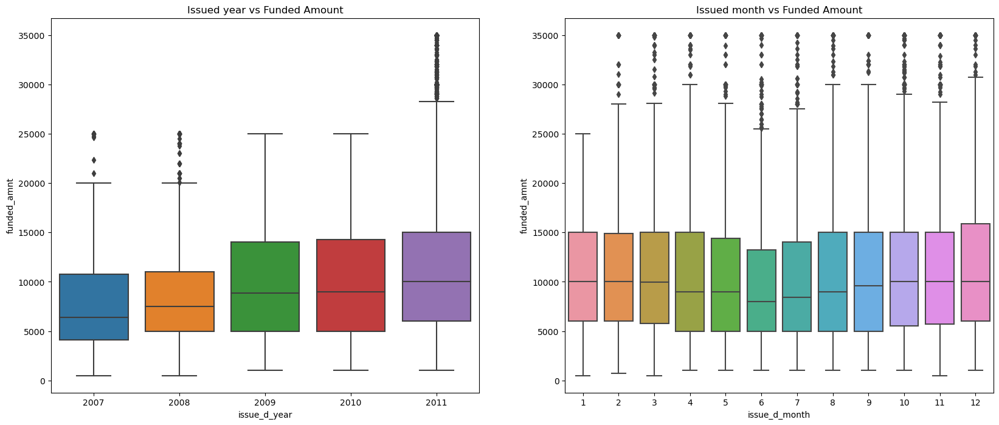

In [206]:
plt.figure(figsize=(20,8))
plt.subplot(121)
sns.boxplot(x=lc_df.issue_d_year, y=lc_df.funded_amnt, data=lc_df)
plt.title('Issued year vs Funded Amount')
plt.subplot(122)
sns.boxplot(x=lc_df.issue_d_month, y=lc_df.funded_amnt, data=lc_df)
plt.title('Issued month vs Funded Amount')
plt.show()

TypeError: Neither the `x` nor `y` variable appears to be numeric.

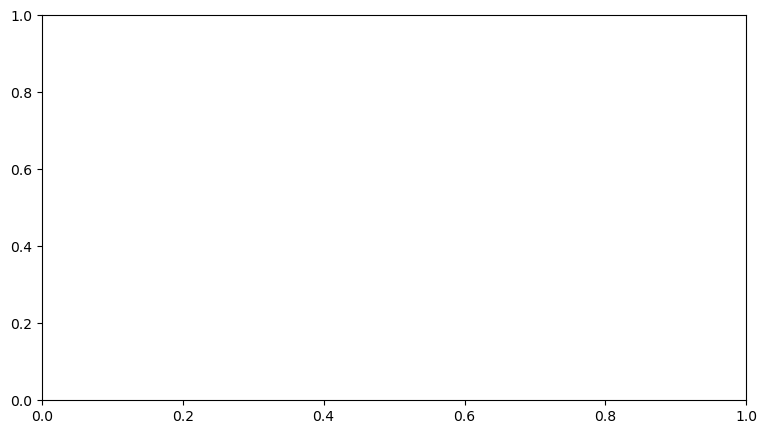

In [209]:
plt.figure(figsize=(20,5))
plt.subplot(121)
sns.boxplot(x=lc_df.term, y=lc_df.int_rate, data=lc_df)
plt.title('Term vs Interest Rate')
plt.subplot(122)
plt.title('Grade vs Interest Rate')


## Anuual income vs Grade

## Dervied Columns

In [186]:
lc_df["Borr_Agency"] = lc_df["funded_amnt"] *100/lc_df["loan_amnt"]
lc_df["agency_Inves"] = lc_df["funded_amnt_inv"]*100/lc_df["funded_amnt"]
lc_df

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,...,verification_status,issue_d,loan_status,pymnt_plan,purpose,dti,issue_d_month,issue_d_year,Borr_Agency,agency_Inves
0,5000,5000,4975.0,36,10.65%,162.87,B,B2,NaN,10+ years,...,Verified,2011-12-01,Fully Paid,n,credit_card,27.65,12,2011,100.0,99.500000
1,2500,2500,2500.0,60,15.27%,59.83,C,C4,Ryder,< 1 year,...,Source Verified,2011-12-01,Charged Off,n,car,1.00,12,2011,100.0,100.000000
2,2400,2400,2400.0,36,15.96%,84.33,C,C5,NaN,10+ years,...,Not Verified,2011-12-01,Fully Paid,n,small_business,8.72,12,2011,100.0,100.000000
3,10000,10000,10000.0,36,13.49%,339.31,C,C1,AIR RESOURCES BOARD,10+ years,...,Source Verified,2011-12-01,Fully Paid,n,other,20.00,12,2011,100.0,100.000000
5,5000,5000,5000.0,36,7.90%,156.46,A,A4,Veolia Transportaton,3 years,...,Source Verified,2011-12-01,Fully Paid,n,wedding,11.20,12,2011,100.0,100.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39712,2500,2500,1075.0,36,8.07%,78.42,A,A4,FiSite Research,4 years,...,Not Verified,2007-07-01,Fully Paid,n,home_improvement,11.33,7,2007,100.0,43.000000
39713,8500,8500,875.0,36,10.28%,275.38,C,C1,"Squarewave Solutions, Ltd.",3 years,...,Not Verified,2007-07-01,Fully Paid,n,credit_card,6.40,7,2007,100.0,10.294118
39714,5000,5000,1325.0,36,8.07%,156.84,A,A4,NaN,< 1 year,...,Not Verified,2007-07-01,Fully Paid,n,debt_consolidation,2.30,7,2007,100.0,26.500000
39715,5000,5000,650.0,36,7.43%,155.38,A,A2,NaN,< 1 year,...,Not Verified,2007-07-01,Fully Paid,n,other,3.72,7,2007,100.0,13.000000


In [194]:
lc_new = lc_df[lc_df["Borr_Agency"] <90]
lc_new.sort_values(by="Borr_Agency",ascending=False)
lc_new

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,...,verification_status,issue_d,loan_status,pymnt_plan,purpose,dti,issue_d_month,issue_d_year,Borr_Agency,agency_Inves
61,17500,8950,8925.000000,60,17.27%,223.74,D,D3,NaN,6 years,...,Verified,2011-12-01,Fully Paid,n,small_business,19.47,12,2011,51.142857,99.720670
66,12500,8925,8925.000000,60,17.27%,223.11,D,D3,grandma kitchen,5 years,...,Source Verified,2011-12-01,Charged Off,n,debt_consolidation,13.16,12,2011,71.400000,100.000000
70,20975,13575,13550.000000,60,17.58%,341.63,D,D4,Dollar Tree Stores,5 years,...,Verified,2011-12-01,Fully Paid,n,credit_card,18.79,12,2011,64.719905,99.815838
80,35000,22075,22050.000000,60,17.27%,551.84,D,D3,tutor Per ini Corporation,3 years,...,Verified,2011-12-01,Fully Paid,n,home_improvement,7.51,12,2011,63.071429,99.886750
96,20000,12800,12775.000000,60,11.71%,282.86,B,B3,NCS Technologies,4 years,...,Verified,2011-12-01,Fully Paid,n,debt_consolidation,10.04,12,2011,64.000000,99.804688
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39533,10000,6000,700.000000,36,8.70%,189.97,B,B1,Lowe's Distribution Center,3 years,...,Not Verified,2007-12-01,Fully Paid,n,debt_consolidation,19.45,12,2007,60.000000,11.666667
39593,20000,4800,1949.999594,36,13.12%,162.01,D,D5,Legal Services of New Jersey,8 years,...,Not Verified,2007-10-01,Charged Off,n,debt_consolidation,16.87,10,2007,24.000000,40.624992
39600,4000,1000,550.000000,36,9.96%,32.25,B,B5,Schering-Plough Corp.,1 year,...,Not Verified,2007-10-01,Charged Off,n,other,5.83,10,2007,25.000000,55.000000
39601,12000,5000,1399.996684,36,10.91%,163.49,C,C3,Staples,1 year,...,Not Verified,2007-10-01,Charged Off,n,other,11.78,10,2007,41.666667,27.999934


In [195]:
lc_new.shape

(1619, 22)

### Observations
##### 1. 75% of applicants who have Fully paid loans requested 15000 and below.
##### 2. Charged off loans have higher average loan amount request compared to Fully paid loans. 
##### 3. 75% of Charged off applicants have requested for loan amount below 17000

In [58]:
fig = px.box(lc_df, x="loan_status", y="annual_inc",title="Annual income between loan status",)
fig.show()

In [59]:
fig = px.box(lc_df, x="loan_status", y="dti",title="Debt to income ratio between loan status",)
fig.show()

In [60]:
fig = px.box(lc_df, x="loan_status", y="installment",title="Installments between loan status",)
fig.show()

# lc_df.groupby('loan_status').installment.plot.bar()

In [61]:
# plt.figure(figsize=(8,5))

# lc_df.groupby(['loan_status'])['sub_grade'].count().plot(kind='bar')
# plt.ylabel('Sub grade')
# plt.title('Loan status vs Sub grade')
# plt.show()
fig = px.histogram(lc_df, x="sub_grade")
fig.show()

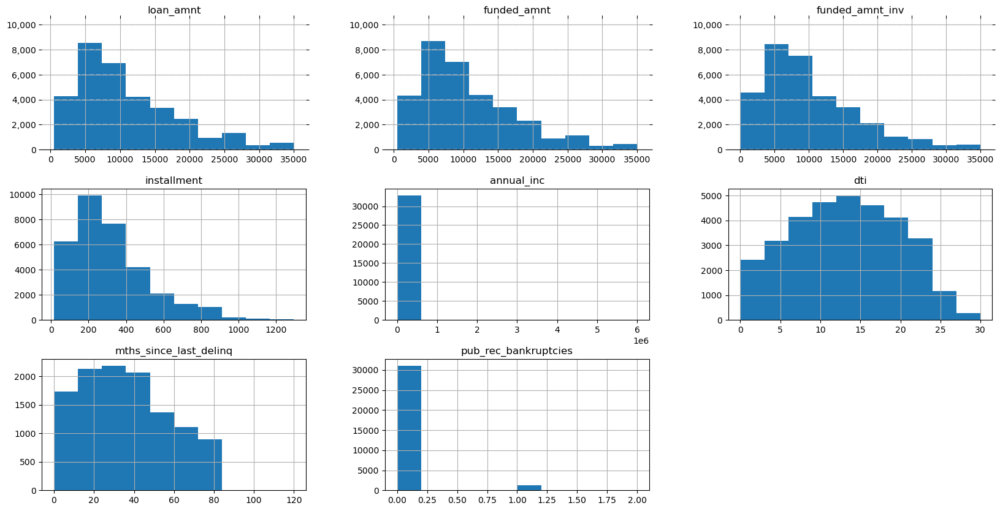

In [55]:
lc_fully_paid = lc_df[lc_df['loan_status'] == "Fully Paid"]
ax = lc_fully_paid.hist(figsize=(20,10))
ax = ax[0]
for x in ax:

    # Despine
    x.spines['right'].set_visible(False)
    x.spines['top'].set_visible(False)
    x.spines['left'].set_visible(False)

    # Switch off ticks
    x.tick_params(axis="both", which="both", bottom="off", top="off", labelbottom="on", left="off", right="off", labelleft="off")

    # Draw horizontal axis lines
    vals = x.get_yticks()
    for tick in vals:
        x.axhline(y=tick, linestyle='dashed', alpha=0.4, color='#eeeeee', zorder=1)

    # Format y-axis label
    x.yaxis.set_major_formatter(StrMethodFormatter('{x:,g}'))

<Axes: xlabel='loan_status'>

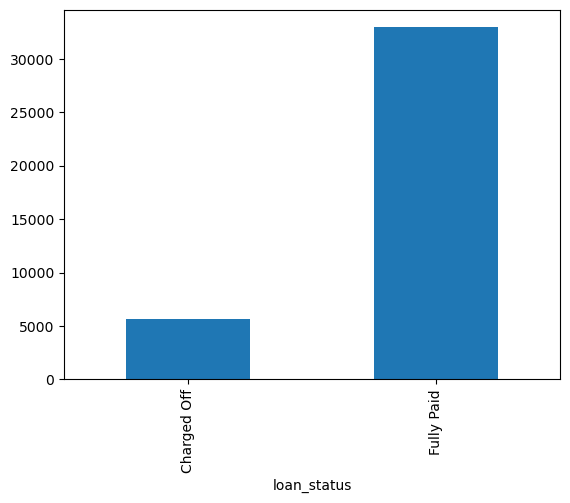

In [103]:
lc_df.groupby('loan_status').loan_amnt.count().plot.bar()
# lc_df['loan_status'].value_counts().plot.bar()

In [119]:
fig = px.bar(lc_df, y="loan_amnt", x="loan_status", color='loan_status')
fig.update_layout(width=700, height=500, bargap=0.05)
fig.show()

### Univariate and segmented univariate analysis is done correctly and appropriate realistic assumptions are made wherever required. The analyses successfully identify at least the 5 important driver variables (i.e. variables which are strong indicators of default).

#### Continuous variable are loan_amnt, funded_amnt_inv
#### Ordered categorical variable are term, grade, sub_grade